<a href="https://colab.research.google.com/github/SharmaAshwini/UNT/blob/main/Scientific%20Data%20Visualization/Altair_interactive_Visualization_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import altair as alt

In [ ]:
print(alt.__version__)

5.0.0rc1


### Loading & Preprocessing CSV Data

In [ ]:
url = 'https://gist.githubusercontent.com/SharmaAshwini/8bd642f6c46792a9c40c8ccad60391e9/raw/4fd45d58a0a81c69814d270d7658f5e2a2d81154/Sample_Superstore.csv'
df_superstore = pd.read_csv(url)
df_superstore['Cost'] = (df_superstore['Sales']-df_superstore['Profit'])
df_superstore['Order Date'] = pd.to_datetime(df_superstore['Order Date'])

### New dataframe with rows less than 5k

In [ ]:
df_1 = df_superstore[(df_superstore['Profit'] > 10)]
df_1.info()
df_1.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4607 entries, 0 to 9993
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         4607 non-null   int64         
 1   Order ID       4607 non-null   object        
 2   Order Date     4607 non-null   datetime64[ns]
 3   Ship Date      4607 non-null   object        
 4   Ship Mode      4607 non-null   object        
 5   Customer ID    4607 non-null   object        
 6   Customer Name  4607 non-null   object        
 7   Segment        4607 non-null   object        
 8   Country        4607 non-null   object        
 9   City           4607 non-null   object        
 10  State          4607 non-null   object        
 11  Postal Code    4607 non-null   int64         
 12  Region         4607 non-null   object        
 13  Product ID     4607 non-null   object        
 14  Category       4607 non-null   object        
 15  Sub-Category   4607 n

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Cost
0,1,CA-2016-152156,2016-08-11,11/11/16,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.960,2,0.0,41.9136,220.0464
1,2,CA-2016-152156,2016-08-11,11/11/16,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.940,3,0.0,219.5820,512.3580
5,6,CA-2014-115812,2014-09-06,14/06/14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,...,West,FUR-FU-10001487,Furniture,Furnishings,Eldon Expressions Wood and Plastic Desk Access...,48.860,7,0.0,14.1694,34.6906
7,8,CA-2014-115812,2014-09-06,14/06/14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,...,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.152,6,0.2,90.7152,816.4368
9,10,CA-2014-115812,2014-09-06,14/06/14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,...,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.900,5,0.0,34.4700,80.4300


## 1.1

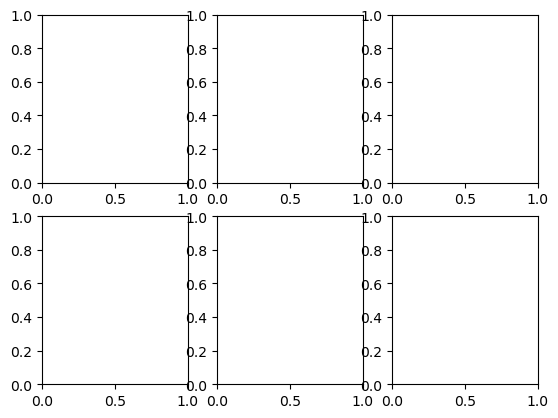

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.subplot(2, 3, 1) #plotting empty sub-plot with 2 rows, 3 columns. 1st chart
plt.subplot(2, 3, 2) #2nd chart
plt.subplot(2, 3, 3) #3rd chart
plt.subplot(2, 3, 4) #4th chart
plt.subplot(2, 3, 5) #5th chart
plt.subplot(2, 3, 6) #6th chart


plt.show() #show plot with 6 sub-plots

## 1.2

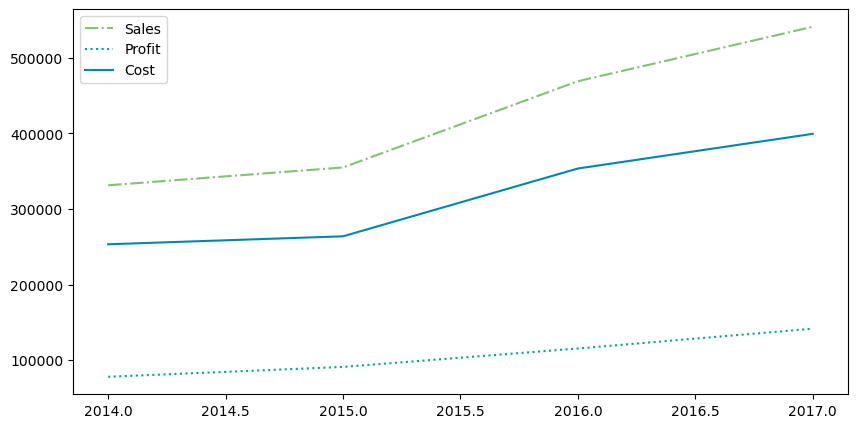

In [ ]:
#aggregating dataset in new dataframe for line chart
df_2 = df_1.groupby(df_1['Order Date'].dt.year).agg({'Sales':[sum], 'Profit': [sum], 'Cost': [sum]})
df_2 = df_2.reset_index()

plt.figure(figsize=(10, 5)) #defining plot size
plt.plot(df_2['Order Date'], df_2['Sales'], label = "Sales", linestyle="-.", color='#82C272') #line for sales
plt.plot(df_2['Order Date'], df_2['Profit'], label = "Profit", linestyle=":", color='#00A88F') #line for profit
plt.plot(df_2['Order Date'], df_2['Cost'], label = "Cost", linestyle="solid", color='#0087AC') #line for cost
plt.legend() #adding legends
plt.show() #show plot with 3 lines

## 1.3

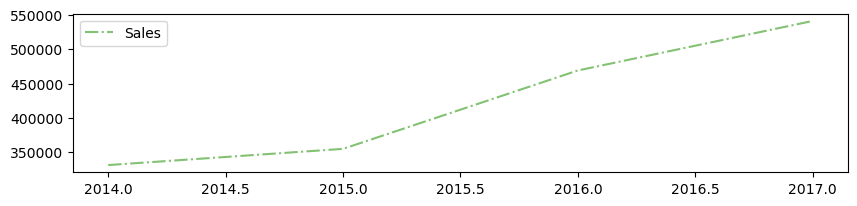

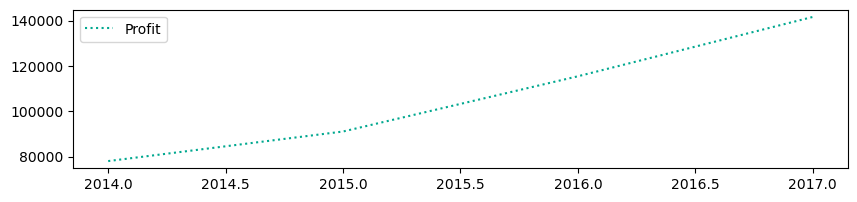

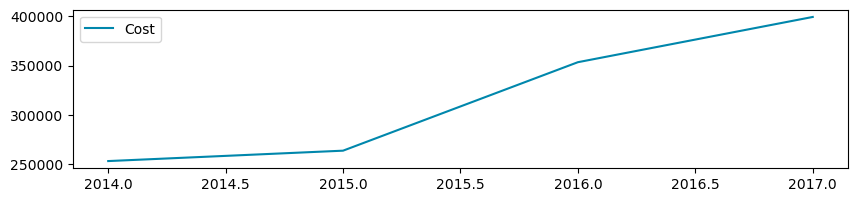

In [ ]:
plt.figure(figsize=(10, 7)) #defining sub-plot size
plt.subplot(3, 1, 1) #sub-plot with 3 rows, 1 column. 1st chart
plt.plot(df_2['Order Date'], df_2['Sales'], label = "Sales", linestyle="-.", color='#82C272') #add line for sales
plt.legend() #adding legends

plt.figure(figsize=(10, 7)) #defining sub-plot size
plt.subplot(3, 1, 2) #sub-plot with 3 rows, 1 column. 2nd chart
plt.plot(df_2['Order Date'], df_2['Profit'], label = "Profit", linestyle=":", color='#00A88F') #add line for profit
plt.legend() #adding legends

plt.figure(figsize=(10, 7)) #defining sub-plot size
plt.subplot(3, 1, 3) #sub-plot with 3 rows, 1 column. 3rd chart
plt.plot(df_2['Order Date'], df_2['Cost'], label = "Cost", linestyle="solid", color='#0087AC') #add line for cost
plt.legend() #adding legends

plt.show() #show 3 sub-plots with 1 line in each sub-plot

## 2.1

In [ ]:
# left panel: scatter plot
scatter = alt.Chart(df_1).mark_point().encode( #using point as a mark
    x=alt.X('Cost'), #Cost on X-axis
    y=alt.Y('Profit'), #Profit on Y-axis
    color=alt.value('#159895'), #Color channel with fixed color code
).properties(
    width=300,
    height=300
) #defining chart's height and width

# right panel: histogram
histo = alt.Chart(df_1).mark_bar().encode( #using bar as a mark
    x=alt.X("yearmonth(Order Date):T").axis(format="%Y-%b"), #YearMonth from order date on X-axis
    y="sum(Sales)", #Sum of sales on Y-axis
    color=alt.value('#1A5F7A'), #Color channel with fixed color code
).properties(
    width=300,
    height=300
) #defining chart's height and width


# concating horizontally:
alt.hconcat(
    scatter, #Plotting scatterplot
    histo #adding histogram
)

alt.HConcatChart(...)

## 2.2 Vertically Aligned

In [ ]:
sel_int = alt.selection_interval(
    encodings=['x'] # mapped selection to x-axis (year) values
)

# top panel: histogram
bar = alt.Chart(df_1).mark_bar().encode( #using bar as a mark
    x=alt.X("yearmonth(Order Date):T").axis(format="%Y-%b"), #YearMonth from order date on X-axis
    y="sum(Sales)", #Sum of sales on Y-axis
    color=alt.value('#1A5F7A'), #Color channel with fixed color code
).add_params(
    sel_int #adding selection parameter
).properties(
    width=650,
    height=150
)#defining chart's height and width

# bottom panel: scatter plot with modified opacity based on selection
scatter = alt.Chart(df_1).mark_circle().encode( #using point as a mark
    x=alt.X('Cost'), #Cost on X-axis
    y=alt.Y('Profit'), #Profit on Y-axis
    color=alt.value('#159895'), #Color channel with fixed color code
    opacity=alt.condition(sel_int, alt.value(0.75), alt.value(0.2)) #selection based opacity
).properties(
    width=650,
    height=400
)#defining chart's height and width

# concating vertically: #Plotting scatterplot and histogram
alt.vconcat(bar, scatter).properties(spacing=5)

alt.VConcatChart(...)

## 2.2 Side by Side

In [ ]:
sel_int = alt.selection_interval(resolve='global') # mapped selection to x-axis (year) values

opacity = alt.condition(sel_int, alt.value(1.0), alt.value(0.3)) #conditional opacity channel

# left panel: scatter plot
scatter = alt.Chart(df_1).mark_point().encode( #using point as a mark
    x=alt.X('Cost'), #Cost on X-axis
    y=alt.Y('Profit'), #Profit on Y-axis
    color=alt.value('#159895'), #Color channel with fixed color code
    opacity=opacity #adding opacity parameter
).properties(
    width=300,
    height=300
) #defining chart's height and width


# right panel: histogram
histo = alt.Chart(df_1).mark_bar().encode( #using bar as a mark
    x=alt.X("yearmonth(Order Date):T").axis(format="%Y-%b"), #YearMonth from order date on X-axis
    y="sum(Sales)", #Sum of sales on Y-axis
    color=alt.value('#1A5F7A'), #Color channel with fixed color code
    opacity=alt.condition(sel_int, alt.value(1.0), alt.value(0.6)) #adding conditional opacity
).properties( #defining chart's height and width
    width=300,
    height=300
).add_params(sel_int) #adding selection parameter

# concating horizontally:
alt.hconcat(
    scatter, #Plotting scatterplot
    histo #adding histogram
)


alt.HConcatChart(...)

## 3.1

In [ ]:
# Scatter Plot
scatter = alt.Chart(df_1).mark_point().encode( #using point as a mark
    x=alt.X('Cost'), #Cost on X-axis
    y=alt.Y('Profit'), #Profit on Y-axis
    color=alt.value('#159895') #Color channel with fixed color code
)


# Plotting chart
scatter


alt.Chart(...)

## 3.2

In [ ]:
# Brush for selection
sel_brush = alt.selection_interval()

# Scatter Plot
scatter = alt.Chart(df_1).mark_point().encode( #using point as a mark
    x=alt.X('Cost'), #Cost on X-axis
    y=alt.Y('Profit'), #Profit on Y-axis
    color=alt.condition(sel_brush, alt.value('#159895'), alt.value('grey')) #Conditional coloring
).add_params(sel_brush) #Adding selection parameter

# Base chart for data tables
text_values = alt.Chart(df_1).mark_text(align='right').encode( #using text as a mark
    y=alt.Y('row_number:O').axis(None) #adding Ordinal row_num on Y axis
).transform_filter(
    sel_brush #Adding selection parameter
).transform_window(row_number='row_number()').transform_filter(
    'datum.row_number < 15' #upper limit for rows to show as text
)

# Data Tables
cost = text_values.encode(text='Cost:Q').properties(
    title=alt.TitleParams(text='Cost Amount', align='right') #cost as a column
)
profit = text_values.encode(text='Profit:Q').properties(
    title=alt.TitleParams(text='Profit Amount', align='right') #profit as a column
)
sales = text_values.encode(text='Sales:Q').properties(
    title=alt.TitleParams(text='Sales Amount', align='right') #sales as a column
)
text = alt.hconcat(cost, profit, sales) # Combine data tables

# Build chart
alt.hconcat(
    scatter, #Plotting scatterplot
    text #Adding text
).resolve_legend(
    color="independent"
).configure_view(
    stroke=None
)


alt.HConcatChart(...)

## 4.1

In [ ]:
#pip install folium

In [ ]:
import folium

In [ ]:
url_lat = 'https://gist.githubusercontent.com/SharmaAshwini/e14462f969c715442ce5ab93c701d81c/raw/8bc932e6adce436d1426023c4600bb1d3e16d4ec/crime_chicago.csv'

df_crime = pd.read_csv(url_lat) #dataframe from new dataset with locations (lat, long)

df_crime = df_crime.dropna() #drop nulls
df_crime.info()

print(df_crime.head()) #print rows


<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 0 to 100
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    100 non-null    int64  
 1   Case Number           100 non-null    object 
 2   Date                  100 non-null    object 
 3   Block                 100 non-null    object 
 4   IUCR                  100 non-null    object 
 5   Primary Type          100 non-null    object 
 6   Description           100 non-null    object 
 7   Location Description  100 non-null    object 
 8   Arrest                100 non-null    bool   
 9   Domestic              100 non-null    bool   
 10  Beat                  100 non-null    int64  
 11  District              100 non-null    float64
 12  Ward                  100 non-null    float64
 13  Community Area        100 non-null    float64
 14  FBI Code              100 non-null    object 
 15  X Coordinate          1

In [ ]:
df_crime = df_crime[["Latitude", "Longitude", "Primary Type"]] #picking only important columns to visualize
print(df_crime.head())


    Latitude  Longitude Primary Type
0  41.815117 -87.670000      BATTERY
1  41.895080 -87.765400        THEFT
2  41.937406 -87.716650    NARCOTICS
3  41.881903 -87.755121      ASSAULT
4  41.744379 -87.658431     BURGLARY


In [ ]:
map = folium.Map(location=[df_crime.Latitude.mean(),
                           df_crime.Longitude.mean()], zoom_start=10, control_scale=True)
#folium map projection with lat long

In [ ]:
map #show map

In [ ]:
for index, location_info in df_crime.iterrows():
    folium.Marker([location_info["Latitude"], location_info["Longitude"]]).add_to(map)

#folium map projection with lat long and markers for lat long in dataframe

In [ ]:
map #display map

## 4.2

In [ ]:
for index, location_info in df_crime.iterrows():
    folium.Marker([location_info["Latitude"], location_info["Longitude"]],
                  popup=location_info["Primary Type"]).add_to(map)

map

#folium map projection with lat long and markers for lat long in dataframe, with on-click tooltip

## 4.3

In [ ]:
crime_color_map = {
    'BATTERY': 'red',
    'THEFT': 'blue',
    'NARCOTICS': 'pink',
    'ASSAULT': 'purple',
    'BURGLARY': 'orange',
    'ROBBERY': 'white',
    'OTHER OFFENSE': 'black',
    'CRIMINAL DAMAGE': 'gray',
    'WEAPONS VIOLATION': 'green',
    'DECEPTIVE PRACTICE': 'cadetblue',
    'CRIMINAL TRESPASS': 'darkgreen',
    'MOTOR VEHICLE THEFT': 'lightblue',
    'SEX OFFENSE': 'darkred'
}

#assiging colors to each crime category

In [ ]:
df_crime
#get the unique names
crimes = df_crime['Primary Type'].unique()

#map the crimes to colors using dictionary created earlier
colors = [crime_color_map[crime] for crime in crimes]

#new dataframe with crimes and their corresponding colors
color_df = pd.DataFrame({'Primary Type': crimes, 'color': colors})

#merging dataframes
df_color = pd.merge(df_crime, color_df, on='Primary Type', how='left')

#display the updated dataframe
print(df_color)

     Latitude  Longitude     Primary Type   color
0   41.815117 -87.670000          BATTERY     red
1   41.895080 -87.765400            THEFT    blue
2   41.937406 -87.716650        NARCOTICS    pink
3   41.881903 -87.755121          ASSAULT  purple
4   41.744379 -87.658431         BURGLARY  orange
..        ...        ...              ...     ...
95  41.910285 -87.766772            THEFT    blue
96  41.754950 -87.559975  CRIMINAL DAMAGE    gray
97  41.895648 -87.758068  CRIMINAL DAMAGE    gray
98  41.771447 -87.685868          BATTERY     red
99  41.752838 -87.620855          ASSAULT  purple

[100 rows x 4 columns]


In [ ]:
for index, location_info in df_color.iterrows():
    folium.Marker([location_info["Latitude"], location_info["Longitude"]],
                  popup=location_info["Primary Type"],
                  icon=folium.Icon(color=location_info["color"])).add_to(map)
#folium map projection with lat long and markers for lat long in dataframe, on-click tooltip and different colors

In [ ]:
map